# Polygonization by rivers & railways

In this notebook, for a given city, we
* load the city boundary polygon
* download and save OSM data on rivers/railways for this polygon
* process the different geometries to end up with one (multi)polygon defining all "natural" barriers
* use that polygon to derive urban blocks delineated by natural barriers
* count number of twitter users in each "natural" block
* visualize to explore results
* save the "natural" polygonzation to gpkg

In [92]:
# import warnings
# warnings.filterwarnings("ignore")
import os
# import sys
# import argparse
# import random
# from time import time
# import numpy as np
# import pandas as pd
# import pickle
import matplotlib.pyplot as plt
import geopandas as gpd
# from shapely.geometry import LineString, Point, MultiPoint, MultiLineString, Polygon
# from tqdm import tqdm
# from geopy.distance import distance, geodesic, great_circle
import osmnx as ox
# import networkx as nx
# import scipy.stats
# from scipy.stats import ks_2samp
# import sklearn
# import igraph
# from igraph import Graph

# from random import choice
# from bisect import bisect_left
# import copy

# from functools import partial
# import pyproj
# from pyproj import Geod
# from pyproj.crs import ProjectedCRS
# from pyproj.crs.coordinate_operation import AzimuthalEquidistantConversion
# from shapely.ops import transform

# import yaml
# from utils import *

In [53]:
import folium

In [15]:
ox.__version__

'1.9.3'

In [3]:
# set OSM highway tags
naturalbarriers_osm_labels = ['motorway', 'trunk', 'motorway_link', 'trunk_link']
naturalbarriers_osm_filter = "['highway'~'motorway|motorway_link|trunk|trunk_link']"

In [4]:
# create subfolders for output data
os.makedirs("../data/natural_barriers/", exist_ok=True)
os.makedirs("../data/natural_barriers/raw/", exist_ok=True)
os.makedirs("../data/natural_barriers/polygons/", exist_ok=True)

In [10]:
gdf_cbsacodes = gpd.read_file('../data/twitter_dummy/cbsacode_random.gpkg')
gdf_cbsacodes

,cbsacode,name,full_name,west,south,east,north,geometry
0,12420,Austin,Austin,-98.297600,29.630718,-97.024461,30.906188,"POLYGON ((-98.04989 30.62415, -98.04954 30.624..."
1,16980,Chicago,Chicago,-88.942146,40.736510,-86.929353,42.669906,"POLYGON ((-88.60224 41.63139, -88.61185 41.631..."
2,33100,Miami,Miami,-80.886232,25.137420,-79.974306,26.970943,"POLYGON ((-80.88123 26.33381, -80.88135 26.333..."
3,38300,Pittsburgh,Pittsburgh,-80.519280,39.720678,-78.974267,41.173134,"POLYGON ((-80.51904 40.47736, -80.51903 40.477..."
4,38900,Portland,Portland,-123.785567,44.885714,-121.514380,46.388629,"POLYGON ((-123.36162 45.77958, -123.36153 45.7..."


In [11]:
# define for which city to run 
cbsacode = 12420

In [12]:
target_city = gdf_cbsacodes[gdf_cbsacodes['cbsacode'] == cbsacode]
city_name = target_city['name'].values[0]
city_boundaries = target_city["geometry"].values[0]
print(f'Target city {city_name}')

Target city Austin


In [13]:
### Download and save OSM data

folder_osm = "../data/natural_barriers/raw/"


if os.path.exists(folder_osm + f'{cbsacode}_raw.parquet'):
    print("loading OSM data of natural barriers...")
    # TODO load data set
    print(f'{cbsacode} natural barriers loaded from file', flush=True)

else:
    print("downloading OSM data of natural barriers...")
    

downloading OSM data of natural barriers...


Download data sets

In [98]:
waterways = ox.features_from_polygon(
    polygon=city_boundaries,
    tags = {
        'waterway':True, 
    }
)
waterways = waterways.explode(ignore_index=True)

railways = ox.features_from_polygon(
    polygon=city_boundaries,
    tags = {
        'railway':True, 
    }
)
railways = railways.explode(ignore_index=True)

Geometry type point: drop directly

In [ ]:
waterways = waterways[waterways.geom_type != "Point"]
railways = railways[railways.geom_type != "Point"]

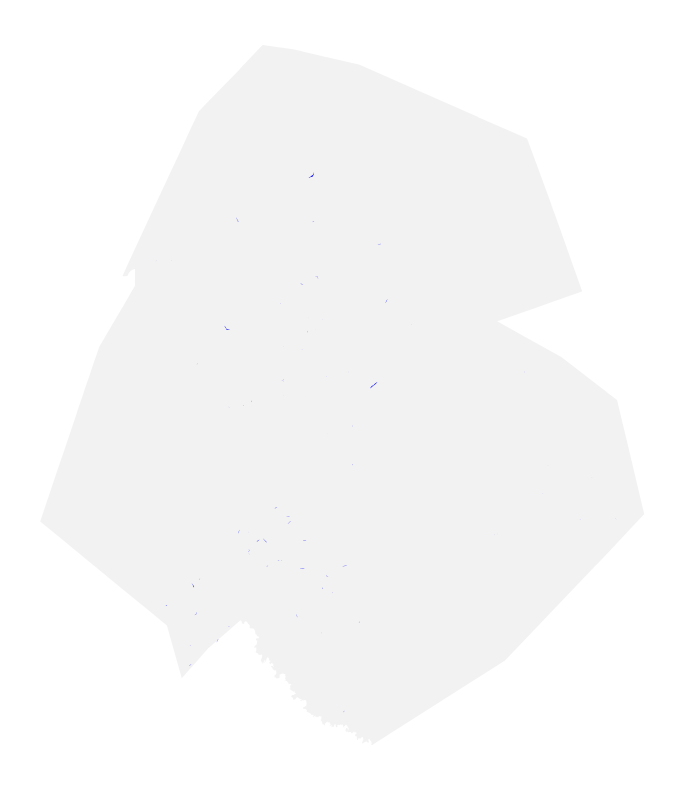

In [97]:
fig, ax = plt.subplots(1,1,figsize = (10,10))
gpd.GeoSeries([city_boundaries], crs=gdf_cbsacodes.crs).plot(ax=ax, alpha = .1, color = "grey")
railways[railways.geom_type =="Polygon"].plot(ax=ax, color = "red")
waterways[waterways.geom_type =="Polygon"].plot(ax=ax, color = "blue")
ax.set_axis_off()

In [61]:
m = features[features.geom_type=="Point"].explore(tiles="CartoDB.Positron", name = "points", color = "red")
gpd.GeoSeries([city_boundaries]).explore(m=m, opacity =.1, name = "city")
railways.explore(m=m, color = "grey", name = "railways")
folium.LayerControl().add_to(m)
m

***

In [ ]:
nodes_gpkg = '../data/twitter_dummy/twitter_users_tract_random.gpkg'
edges_gpkg = '../data/twitter_dummy/twitter_follower_edges_random.gpkg'

*******

In [2]:
mytag = "waterway"
myplace = "Cleveland, Ohio"

In [3]:
ox.settings.use_cache = False
ox.settings.useful_tags_way = ["railway", "waterway", "tunnel"]

In [25]:
gdf = ox.features_from_place(query="Cleveland, Ohio", tags = {"railway":True,"waterway":True})

In [31]:
from collections import Counter
Counter(gdf.geometry.type)

Counter({'LineString': 2192, 'Point': 1015, 'Polygon': 40})

In [28]:
gdf.head()

railway                    geometry source  \
element_type osmid                                                          
node         105525953  level_crossing  POINT (-81.66833 41.46912)    NaN   
             105532084  level_crossing  POINT (-81.54092 41.56975)    NaN   
             105535666          switch  POINT (-81.70346 41.47727)    NaN   
             105535711          switch  POINT (-81.69494 41.48682)    NaN   
             105535736  level_crossing  POINT (-81.69804 41.48144)    NaN   

                       railway:turnout_side railway:position crossing:barrier  \
element_type osmid                                                              
node         105525953                  NaN              NaN              NaN   
             105532084                  NaN              NaN              NaN   
             105535666                  NaN              NaN              NaN   
             105535711                  NaN              NaN              NaN   
             105535736                  NaN              NaN              NaN   

                       highway crossing:bell crossing:light name  ... oneway  \
element_type osmid                                                ...          
node         105525953     NaN           NaN            NaN  NaN  ...    NaN   
             105532084     NaN           NaN            NaN  NaN  ...    NaN   
             105535666     NaN           NaN            NaN  NaN  ...    NaN   
             105535711     NaN           NaN            NaN  NaN  ...    NaN   
             105535736     NaN           NaN            NaN  NaN  ...    NaN   

                       structure width bench  bin tactile_paving comment  \
element_type osmid                                                         
node         105525953       NaN   NaN   NaN  NaN            NaN     NaN   
             105532084       NaN   NaN   NaN  NaN            NaN     NaN   
             105535666       NaN   NaN   NaN  NaN            NaN     NaN   
             105535711       NaN   NaN   NaN  NaN            NaN     NaN   
             105535736       NaN   NaN   NaN  NaN            NaN     NaN   

                       level intermittent FIXME  
element_type osmid                               
node         105525953   NaN          NaN   NaN  
             105532084   NaN          NaN   NaN  
             105535666   NaN          NaN   NaN  
             105535711   NaN          NaN   NaN  
             105535736   NaN          NaN   NaN  

[5 rows x 107 columns]

***

In [4]:
G_water = ox.gdf_from_place(
    myplace, 
    custom_filter=r'["waterway"~"\w*"]',
    retain_all=True,
    truncate_by_edge=True,
    simplify=True)
G_rail = ox.graph_from_place(
    myplace, 
    custom_filter=r'["railway"~"\w*"]',
    retain_all=True,
    truncate_by_edge=True,
    simplify=True)


In [5]:
edges_water = ox.graph_to_gdfs(G_water, nodes = False, edges = True)
edges_rail = ox.graph_to_gdfs(G_rail, nodes = False, edges = True)

In [12]:
m = edges_water.explore(color = "blue")
edges_rail.explore(m=m, color = "red")
folium.LayerControl().add_to(m)
m

# Suggested workflow:

* get all natural barriers data into one geometry collection
* segmentize highway linestrings
* for each point, find distance to nearest point on natural barrier geom collection
* check distribution of those distances
* for (consecutive?) points that are all within the same (narrowly defined) distance from the geom collection - we can think that they are parallel to 